### Visualize scVI embeddings
On subsets

In [1]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse
import anndata
import seaborn as sns

In [2]:
## import utils
cwd = '../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils

### Load data and embeddings

In [3]:
def load_scvi_outs(adata, emb_file, load_clustering=True):
    X_scVI_emb = np.load(emb_file)
    X_scVI_umap = np.load(emb_file.rstrip(".npy") + ".UMAP.npy")
    adata.obsm["X_scvi"] = X_scVI_emb
    adata.obsm["X_umap"] = X_scVI_umap
    if load_clustering:
        X_scVI_clust = pd.read_csv(emb_file.rstrip(".npy") + ".clustering.csv", index_col=0)
        adata.obs["scvi_clusters"] = X_scVI_clust.loc[adata.obs_names]["leiden_150"].astype("category")

In [16]:
def load_data_split(data_dir, timestamp, split):
    # Load estimated gene dispersions for HVG selection
    # Generated running `Pan_fetal_immune/utils/PFI_pp_4_HVG_stats.py`
    adata_lognorm_var = pd.read_csv(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.var.csv'.format(t=timestamp, s=split), index_col=0)

    ### Load gex data
    adata_raw = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.h5ad'.format(t=timestamp, s=split))
    adata_raw.var_names_make_unique()

    # Load obs
    new_obs = pd.read_csv(data_dir + "PAN.A01.v01.entire_data_normalised_log.{t}.full_obs.csv".format(t=timestamp), index_col=0)
    adata_raw.obs = new_obs.loc[adata_raw.obs_names]

    ## Load var
    adata_raw.var = adata_lognorm_var.copy()

    ## Add batch key
    adata_raw.obs["bbk"] = adata_raw.obs["method"] + adata_raw.obs["donor"]
    return(adata_raw)

In [5]:
data_dir="/nfs/team205/ed6/data/Fetal_immune/"
timestamp="20210429"

## STROMA

In [17]:
split="STROMA"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [18]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [19]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


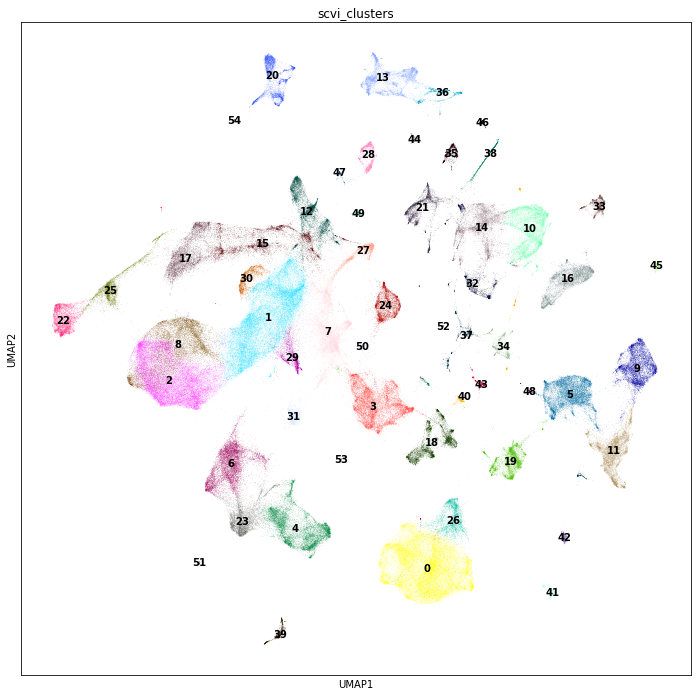

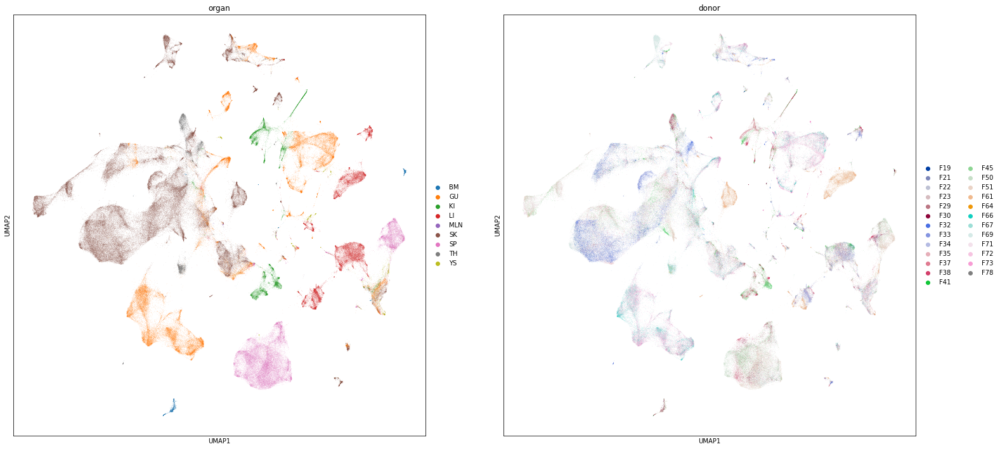

In [20]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

In [21]:
stromal_labels = adata.obs.uniform_label[adata.obs.uniform_label_lvl0.isin(['STROMAL',
 'VASCULATURE','MUSCLE','NEURAL CREST',
 'MESENCHYMAL_PROGENITOR','EPI',
 'HEPATOCYTE',
 'ADIPOSE',
 'MELANOCYTE',
 'NEURONAL',
 'OSTEOCHONDRAL',
 'KERATINOCYTES',
 'NEPHRON'])].unique()

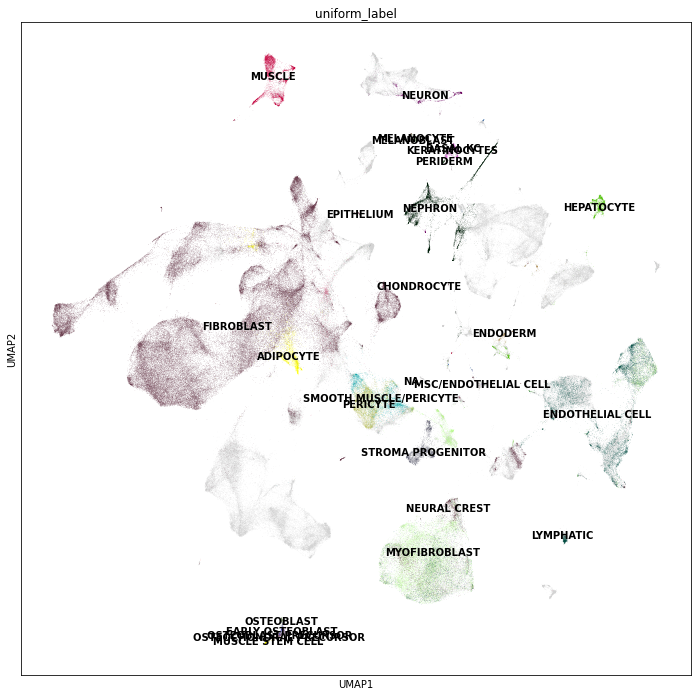

In [22]:
sc.pl.umap(adata, color=["uniform_label"], legend_loc="on data", groups=stromal_labels)

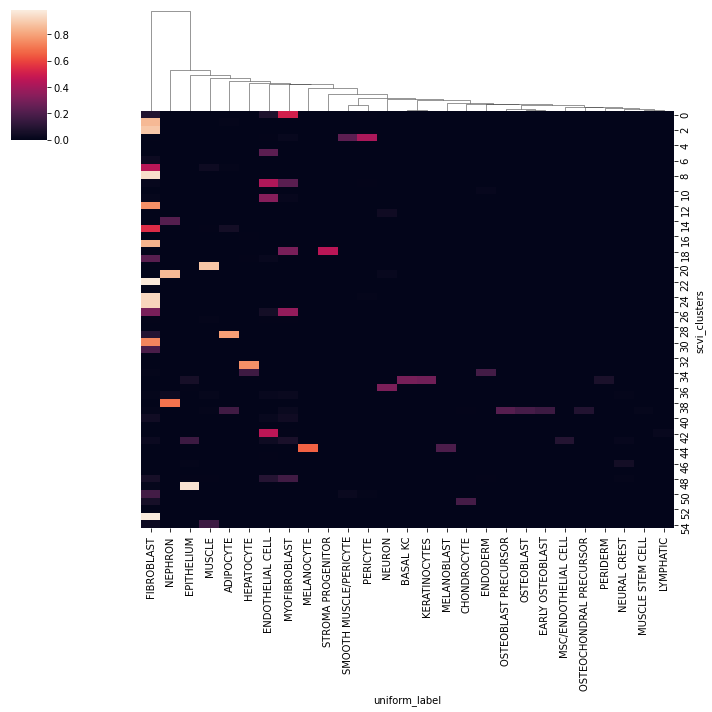

In [23]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["uniform_label"])
cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat[stromal_labels], row_cluster=False)

In [27]:
sc.pp.neighbors(adata, use_rep = "X_scvi", n_neighbors = 30, key_added="scvi")

adata.obs["leiden_150"] = adata.obs["scvi_clusters"]

adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

## ERYTHROID/MEGAKARYOCYTE

In [203]:
split="MEM_PROGENITORS"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [204]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [205]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


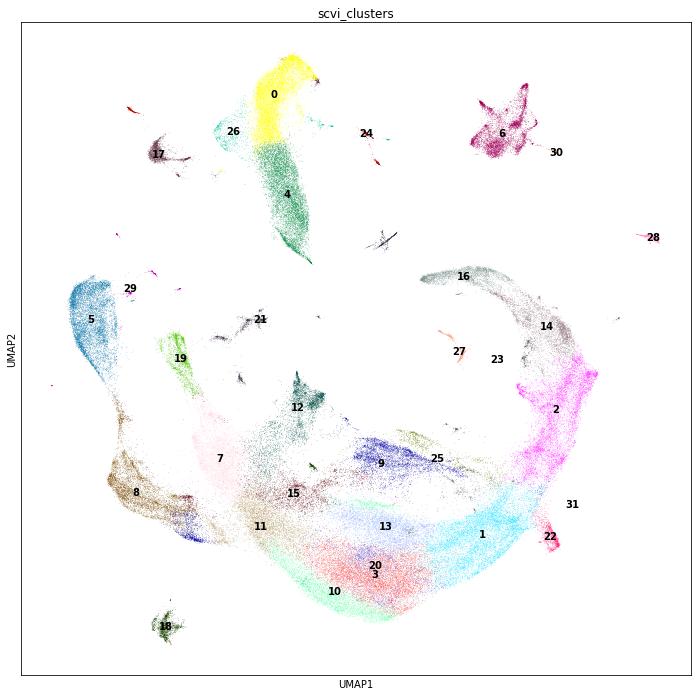

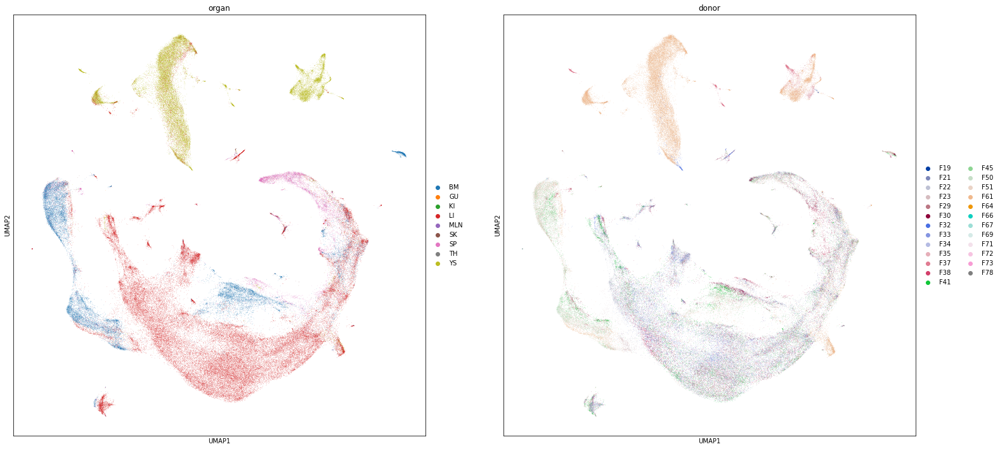

In [206]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [207]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


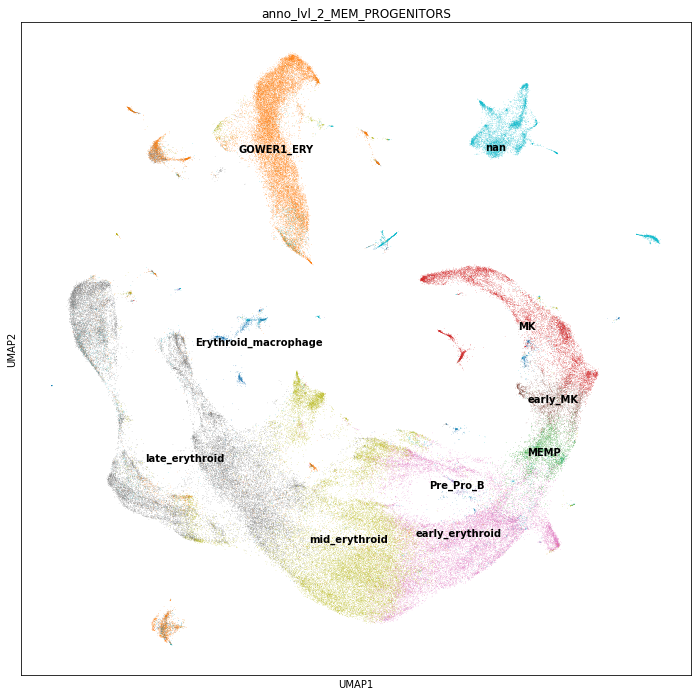

In [208]:
sc.pl.umap(adata, color=["anno_lvl_2_MEM_PROGENITORS"], legend_loc="on data")

In [209]:
adata.var_names = adata.var["GeneName"]

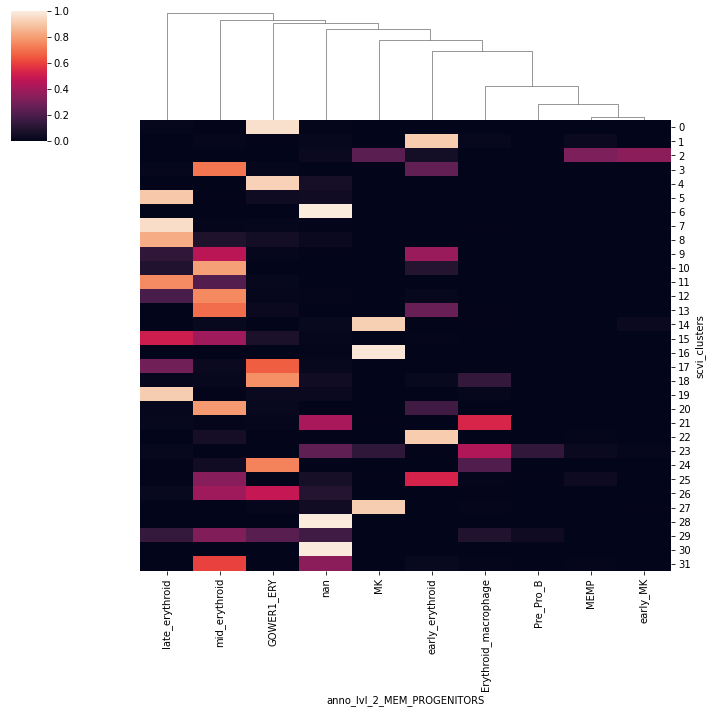

In [211]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["anno_lvl_2_MEM_PROGENITORS"])
cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat, row_cluster=False)

## MYELOID

In [43]:
split="MYELOID"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [44]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [45]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


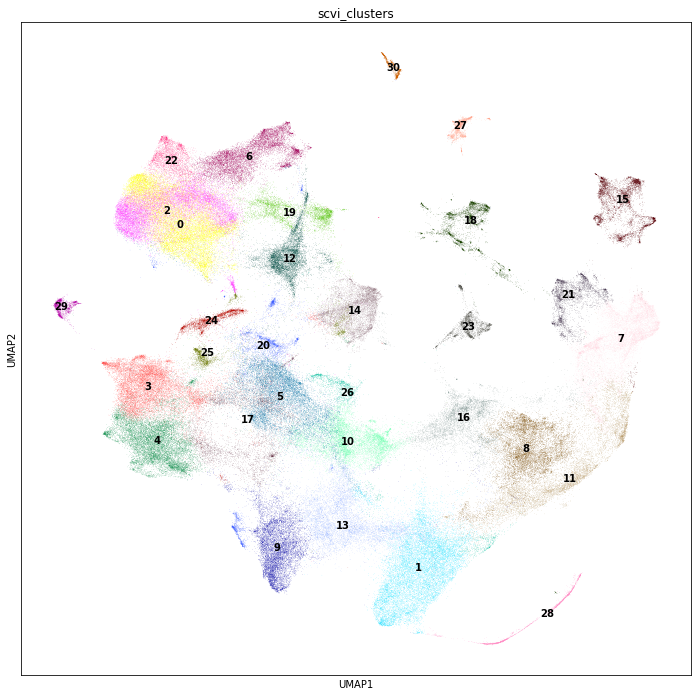

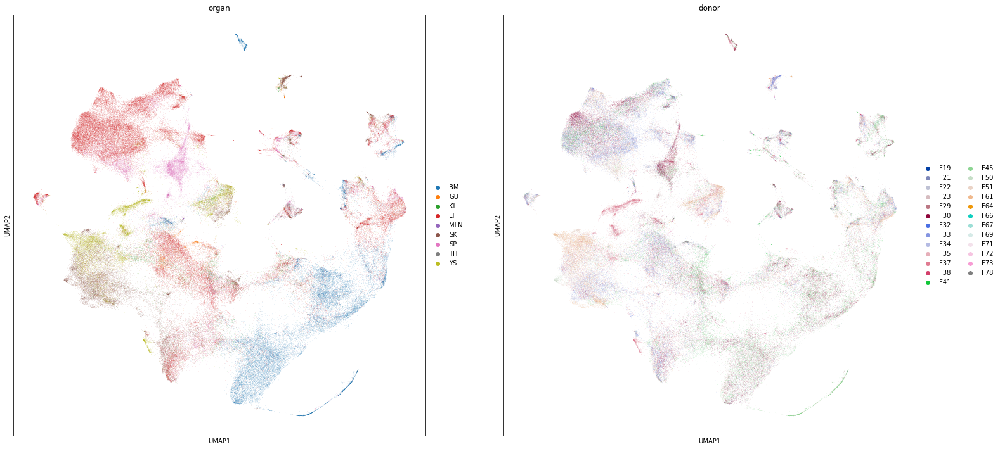

In [46]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [47]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


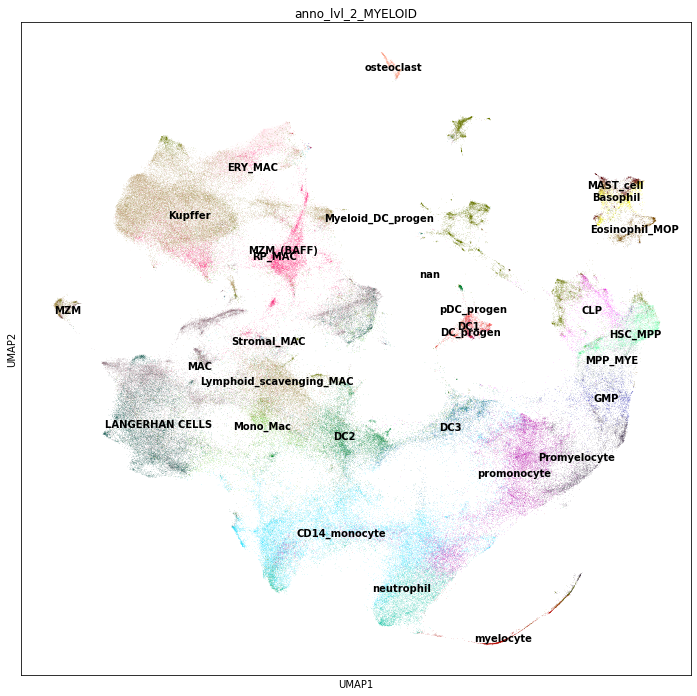

In [48]:
sc.pl.umap(adata, color=["anno_lvl_2_MYELOID"], legend_loc="on data")

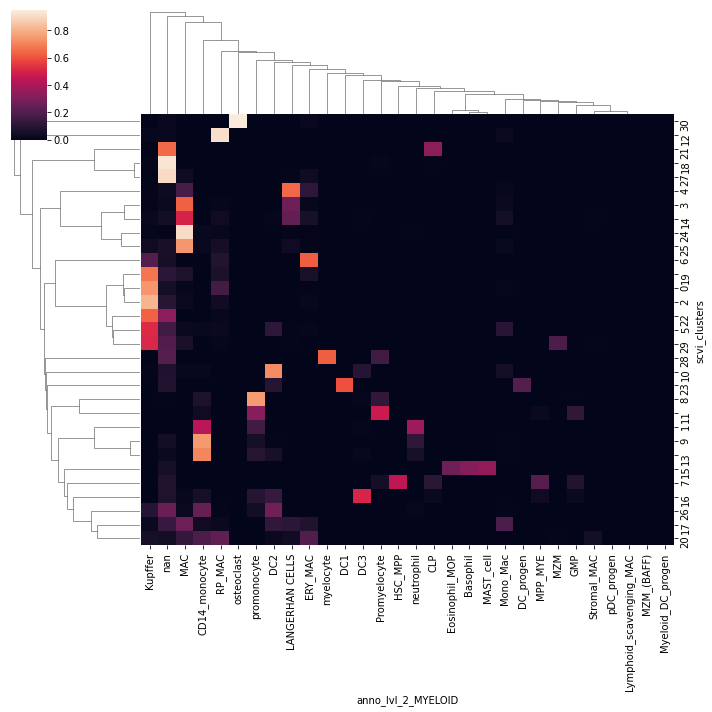

In [49]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["anno_lvl_2_MYELOID"])
cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat)

In [50]:
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

## LYMPHOID

In [28]:
split="LYMPHOID"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [29]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [30]:
load_scvi_outs(adata, emb_file)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


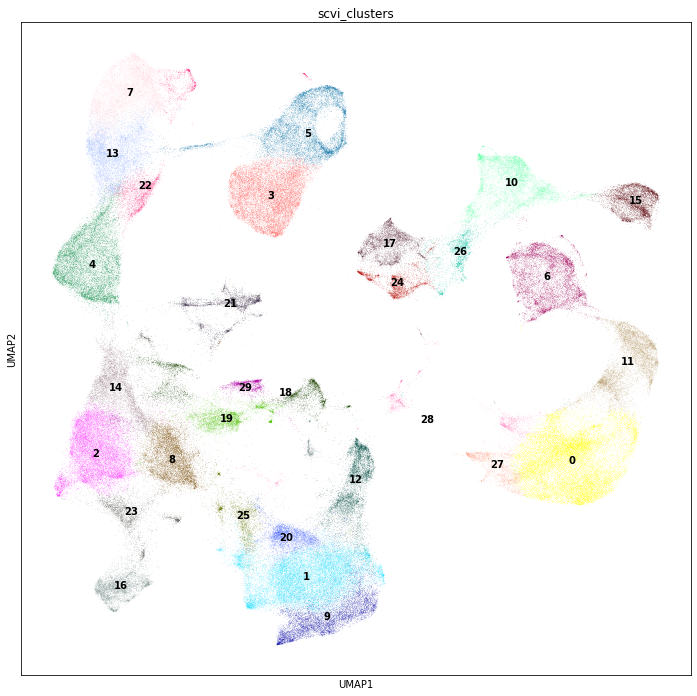

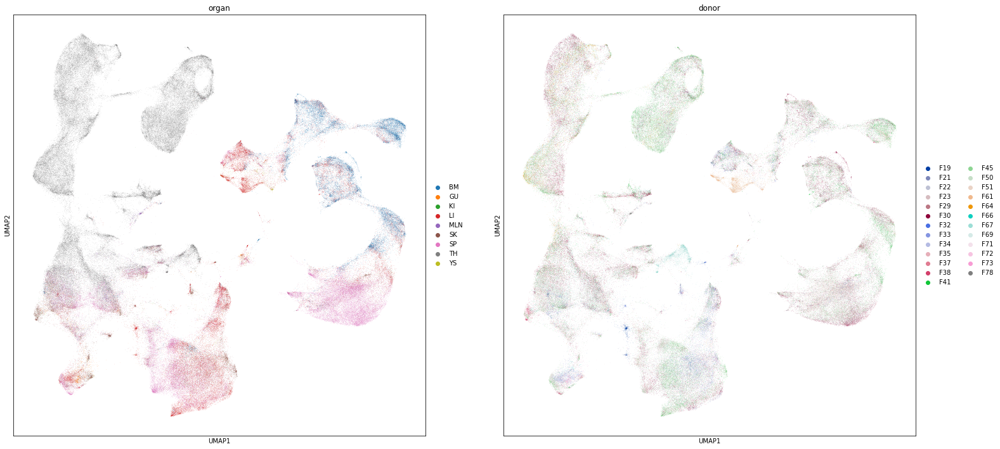

In [31]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [32]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


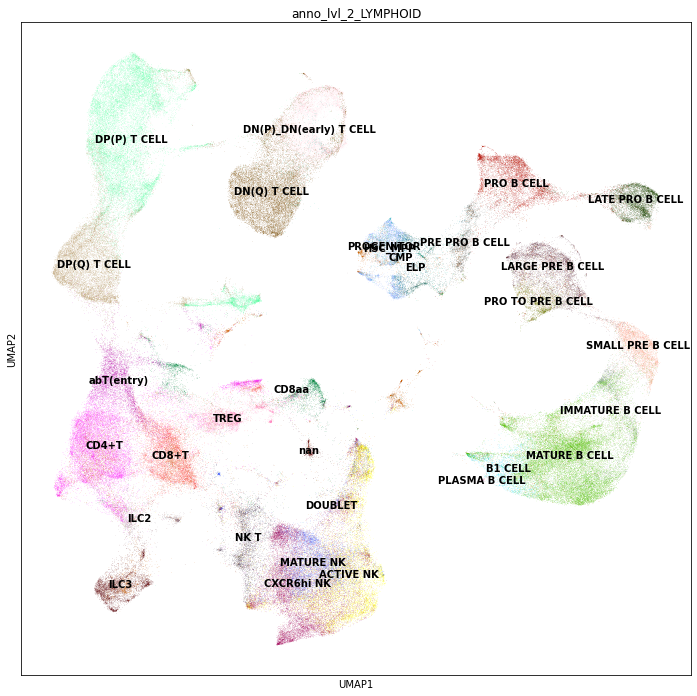

In [33]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], legend_loc="on data")

In [34]:
## Read markers
markers_dir = "/home/jovyan/mount/gdrive/Pan_fetal/significant_genes/marker genes/"
nkt_markers = pd.read_csv(markers_dir + "NKT_marker_genes.csv", header=None)
nkt_markers.columns = ["gene", "anno_lvl_2"]

In [35]:
b_markers = pd.read_csv(markers_dir + "B_marker_genes.csv", header=None)
b_markers.columns = ["gene", "anno_lvl_2"]

In [36]:
adata.obs["scvi_clusters"] = adata.obs["scvi_clusters"].astype("str").astype("category") 
sc.tl.dendrogram(adata, groupby="scvi_clusters", use_rep="X_scvi")
sc.tl.dendrogram(adata, groupby="scvi_clusters", use_rep="X_scvi")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
categories: 0, 1, 10, etc.
var_group_labels: DN(early), DN(P), DN(Q), etc.


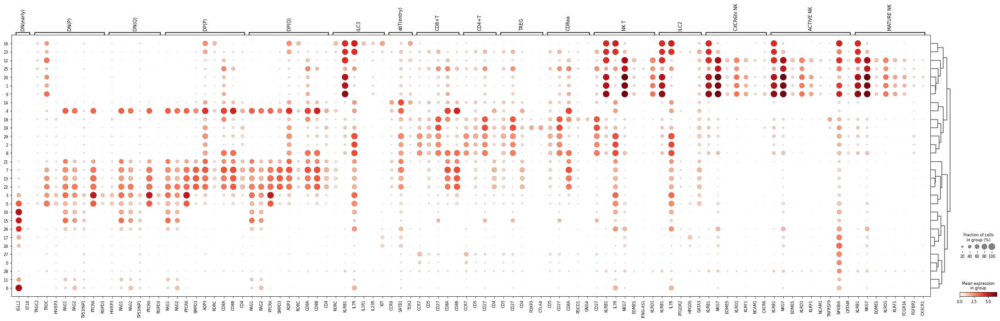

In [37]:
anno_k = nkt_markers.anno_lvl_2.unique()
marker_dict = {}
for k in anno_k:
    marker_dict[k] = nkt_markers.gene[nkt_markers.anno_lvl_2==k].tolist()
sc.pl.dotplot(adata, marker_dict, groupby="scvi_clusters", dendrogram=True)

In [38]:
# sc.pl.dotplot(adata, nkt_markers.gene.unique(), groupby="scvi_clusters", dendrogram=True)
# sc.pl.dotplot(adata, b_markers.gene.unique(), groupby="scvi_clusters", dendrogram=True)

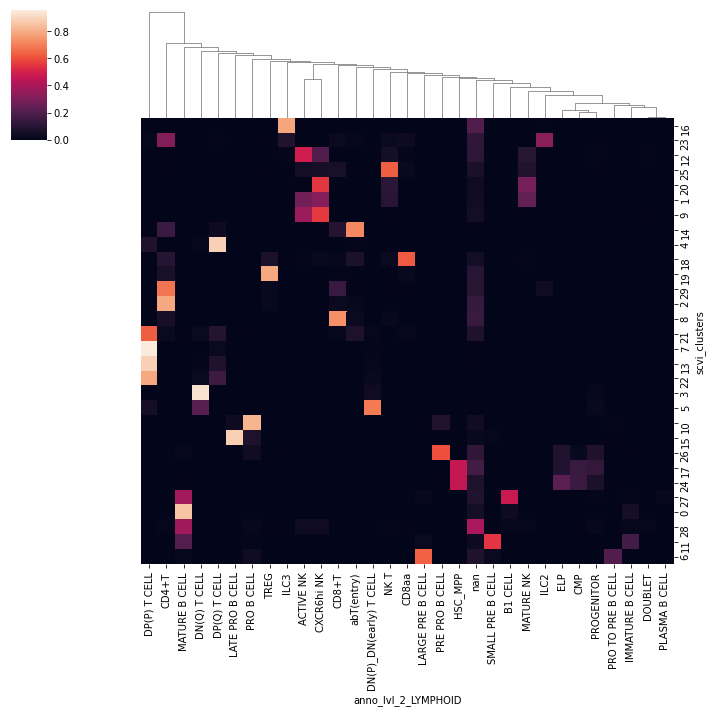

In [39]:
conf_mat = pd.crosstab(adata.obs["scvi_clusters"], adata.obs["anno_lvl_2_LYMPHOID"])
conf_mat = conf_mat.loc[adata.uns["dendrogram_scvi_clusters"]["categories_ordered"]]

cl_frac_mat = (conf_mat.T/conf_mat.sum(1)).T

sns.clustermap(cl_frac_mat, row_cluster=False)

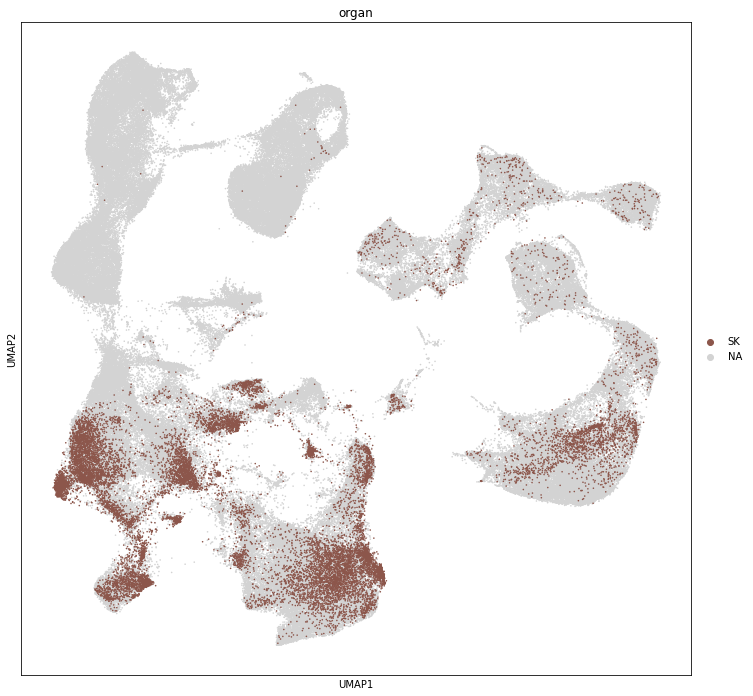

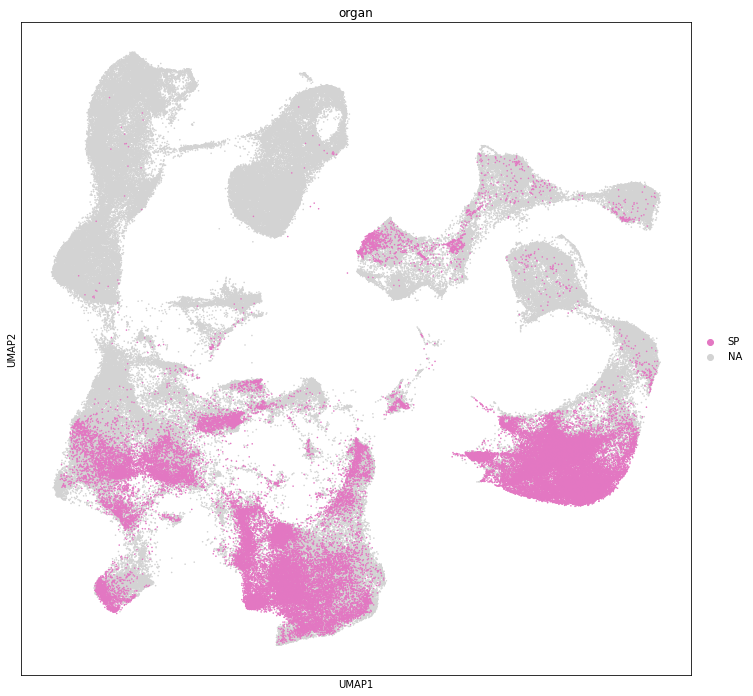

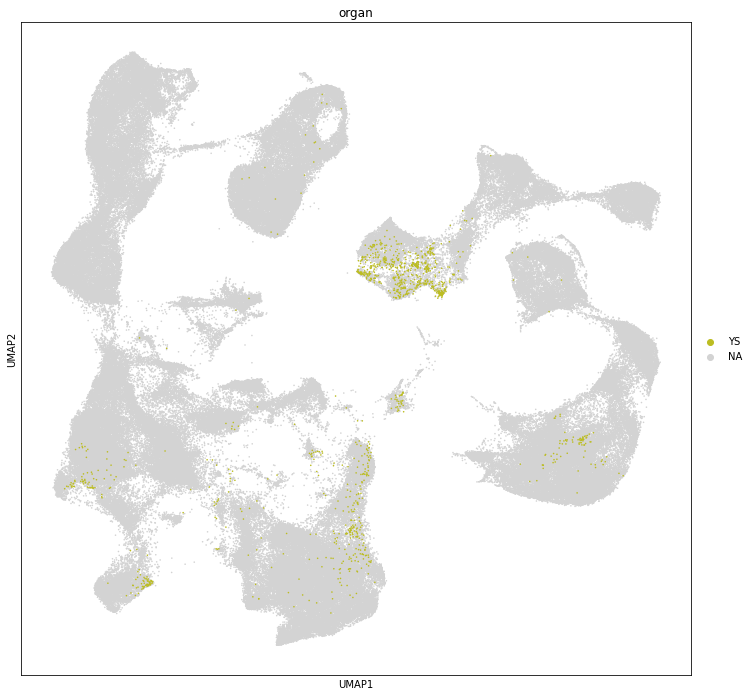

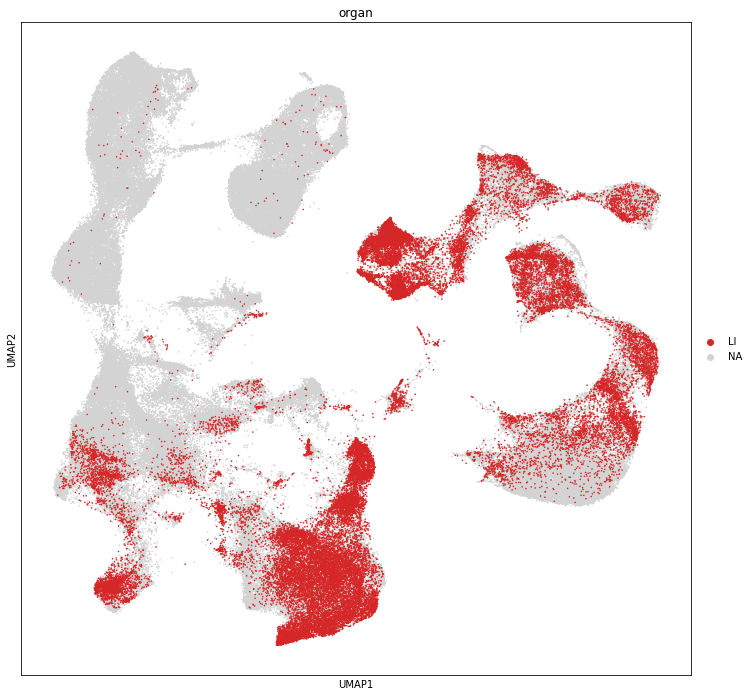

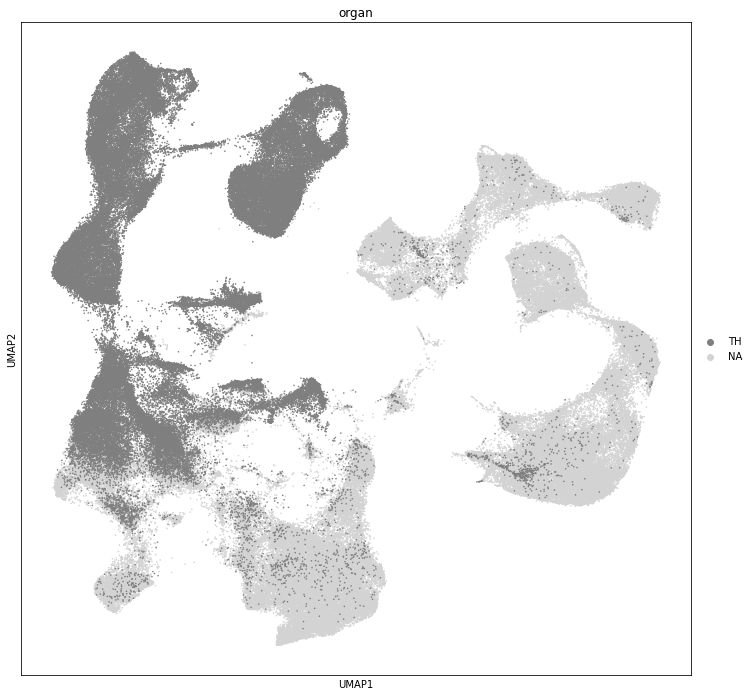

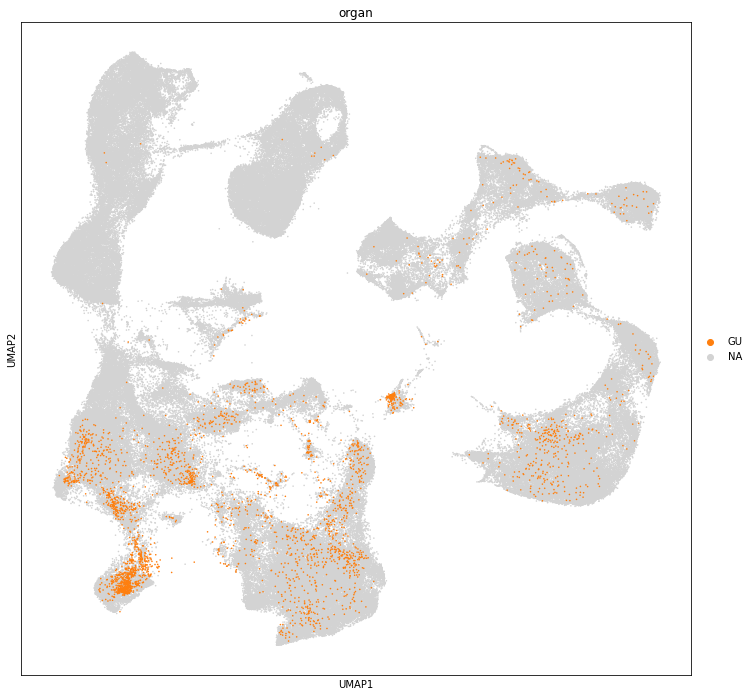

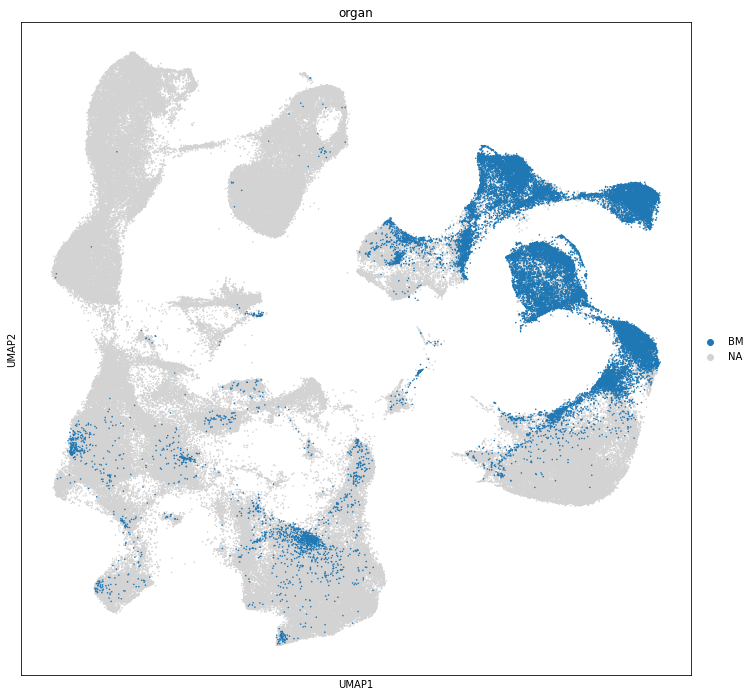

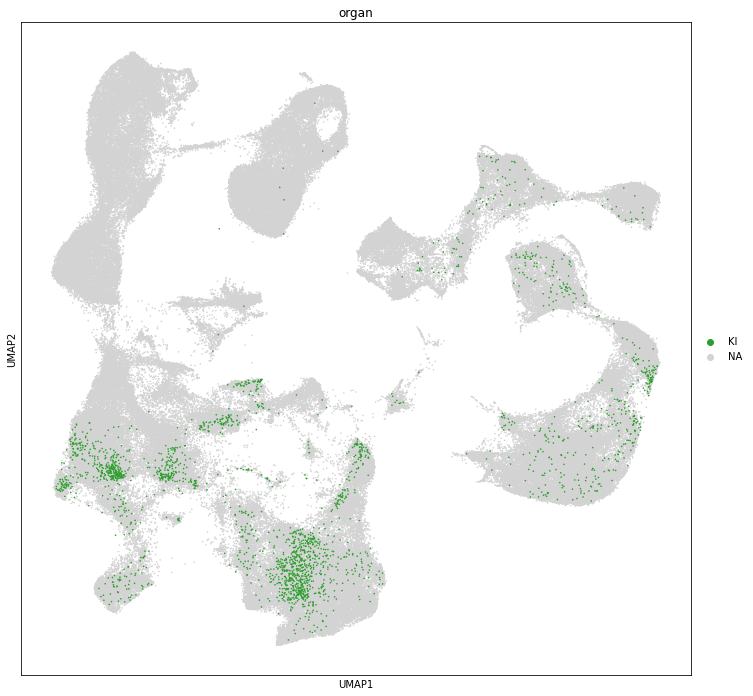

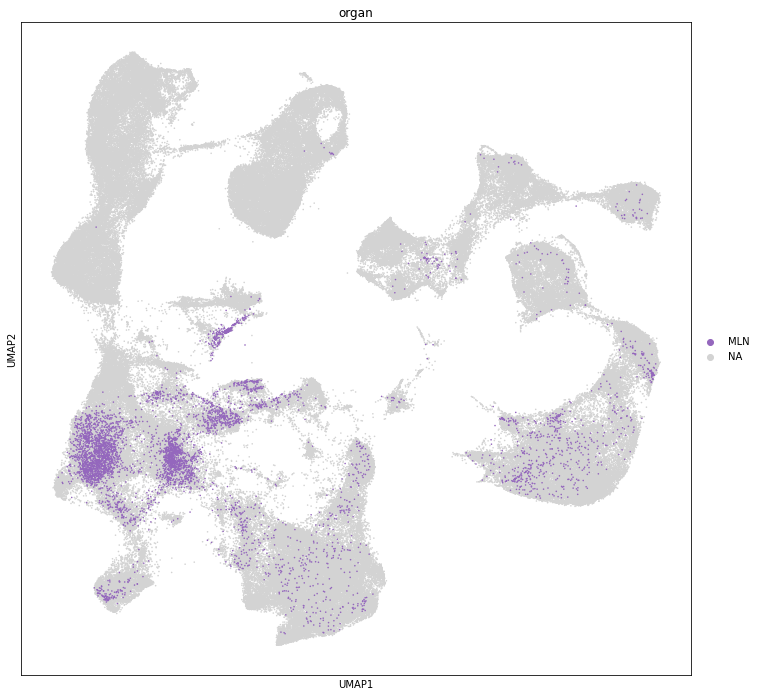

In [40]:
for o in adata.obs['organ'].unique():
    sc.pl.umap(adata, color=["organ"], groups=[o], size=10)

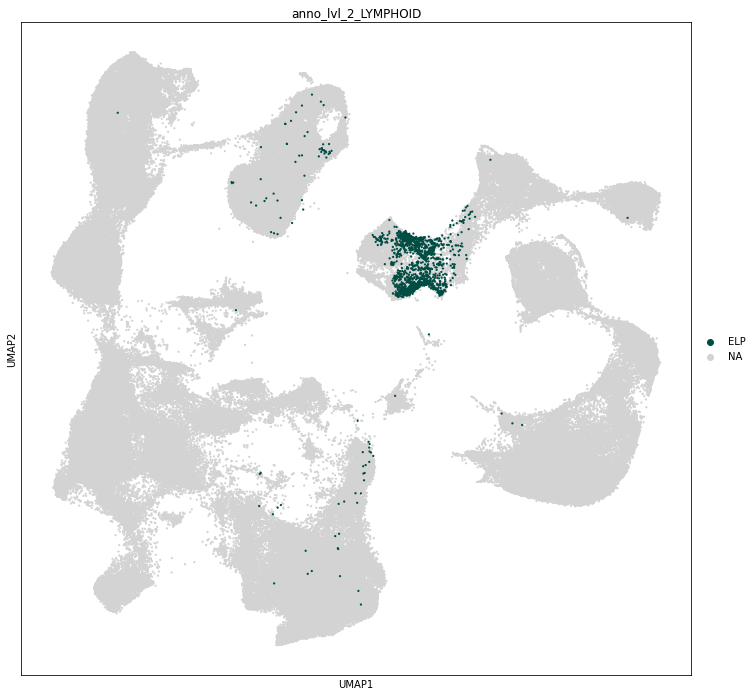

In [41]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], size=20, ncols=3, groups=["ELP"])

In [42]:
sc.pp.neighbors(adata, use_rep = "X_scvi", n_neighbors = 30, key_added="scvi")
adata.obs["leiden_150"] = adata.obs["scvi_clusters"]
adata.write_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))

### ALL HEMATOPOIETIC/IMMUNE

In [267]:
split="HSC_IMMUNE"
adata = load_data_split(data_dir, timestamp, split)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [268]:
emb_file = data_dir + "scVI_outs/" + 'PAN.A01.v01.entire_data_raw_count.{t}.{s}.scVI_out.npy'.format(t=timestamp, s=split)

In [269]:
load_scvi_outs(adata, emb_file, load_clustering=True)

... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'organ' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical
... storing 'Sample' as categorical
... storing 'bbk' as categorical
... storing 'GeneName' as categorical


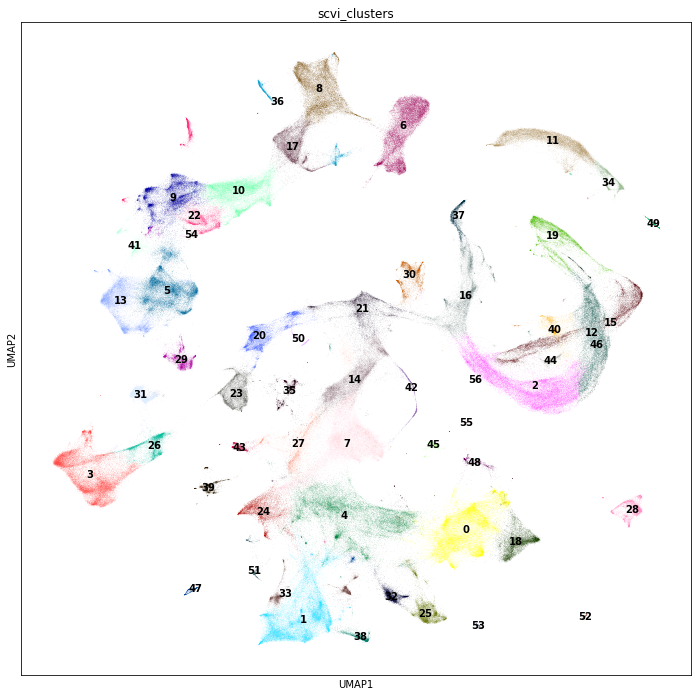

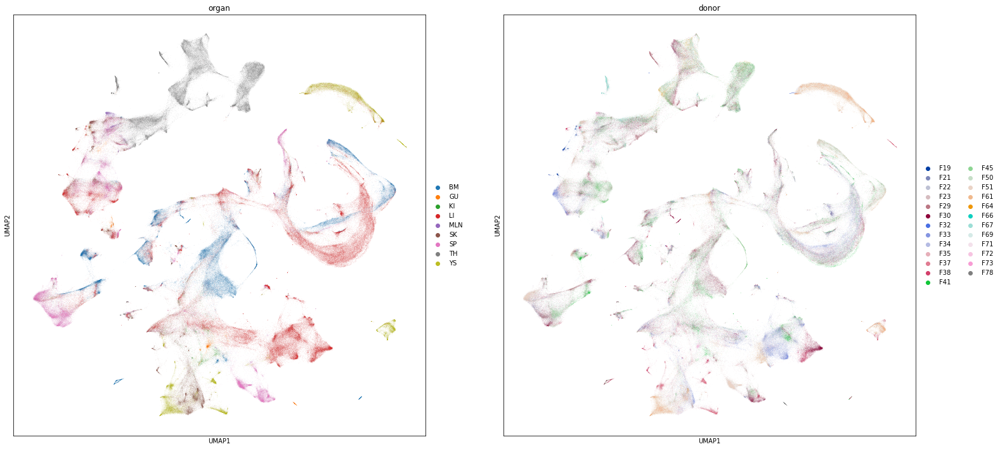

In [272]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color=["scvi_clusters"], legend_loc="on data")
sc.pl.umap(adata, color=["organ", "donor"])

Load manual annotations

In [302]:
anno_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/old_adatas/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.full_obs.annotated.csv", index_col=0)
anno_obs_spl = anno_obs[anno_obs.index.isin(adata.obs_names)]
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_LYMPHOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MYELOID"]]], 1)
adata.obs = pd.concat([adata.obs, anno_obs_spl[["anno_lvl_2_MEM_PROGENITORS"]]], 1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (9,13,14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


... storing 'anno_lvl_2_LYMPHOID' as categorical
... storing 'anno_lvl_2_MYELOID' as categorical
... storing 'anno_lvl_2_MEM_PROGENITORS' as categorical


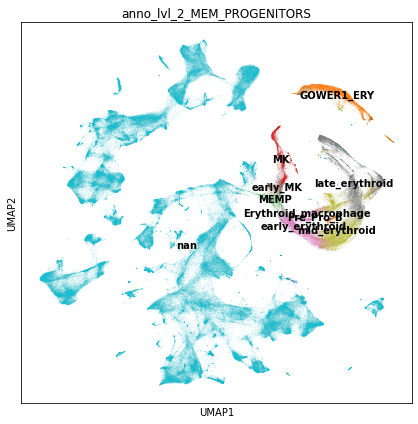

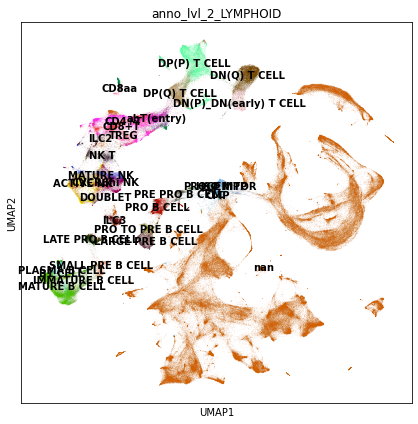

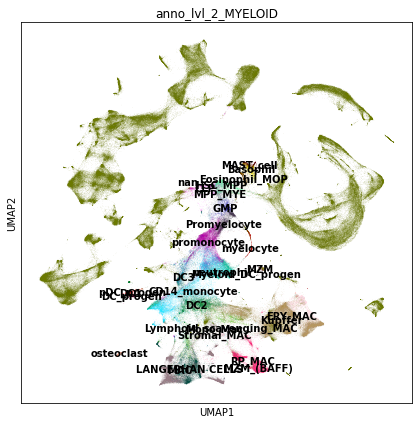

In [303]:
sc.pl.umap(adata, color=["anno_lvl_2_MEM_PROGENITORS"], legend_loc="on data")
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], legend_loc="on data")
sc.pl.umap(adata, color=["anno_lvl_2_MYELOID"], legend_loc="on data")

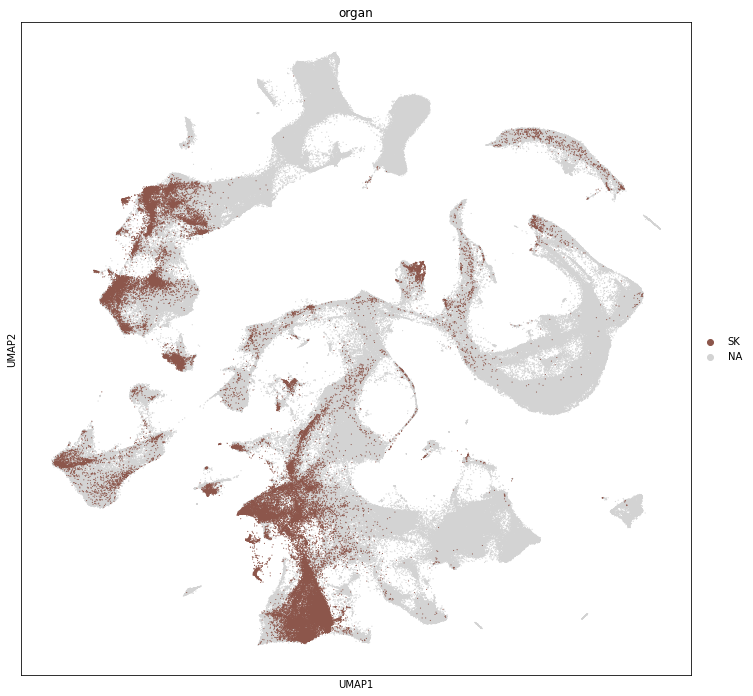

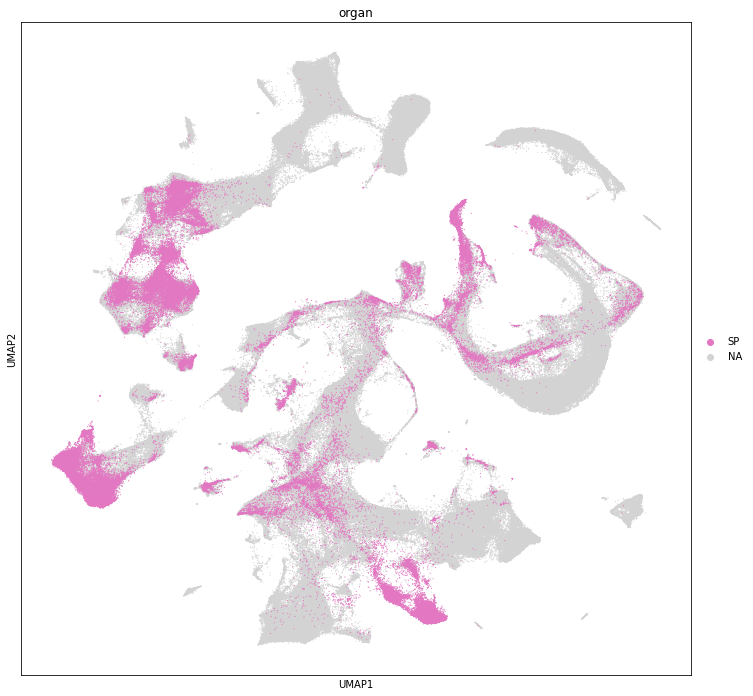

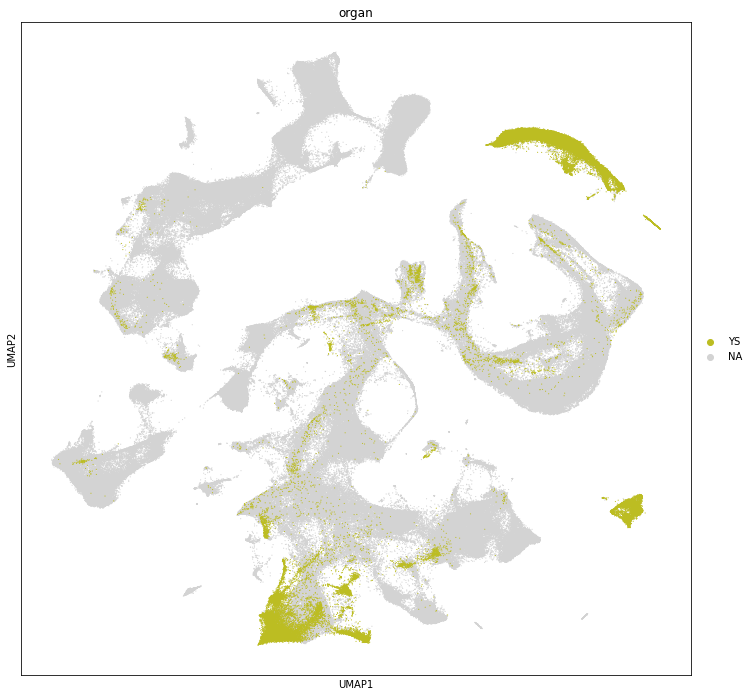

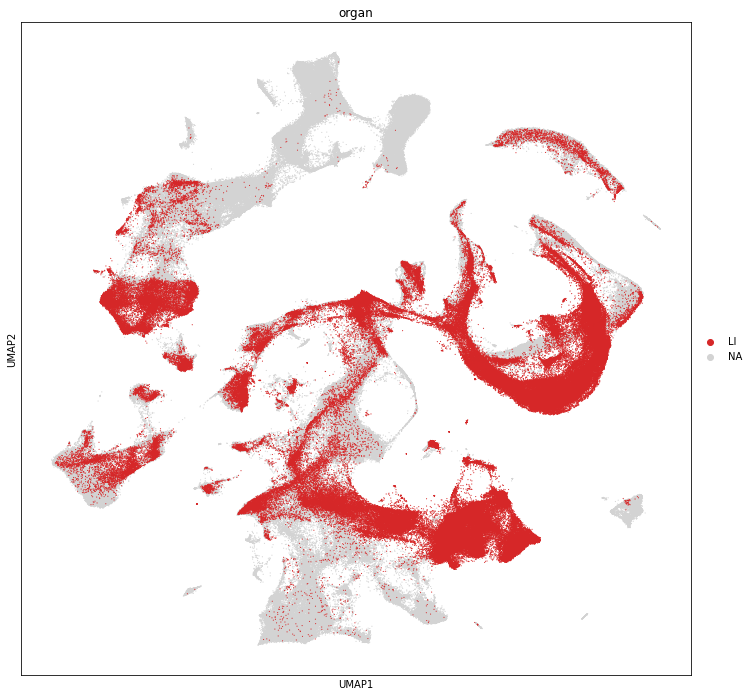

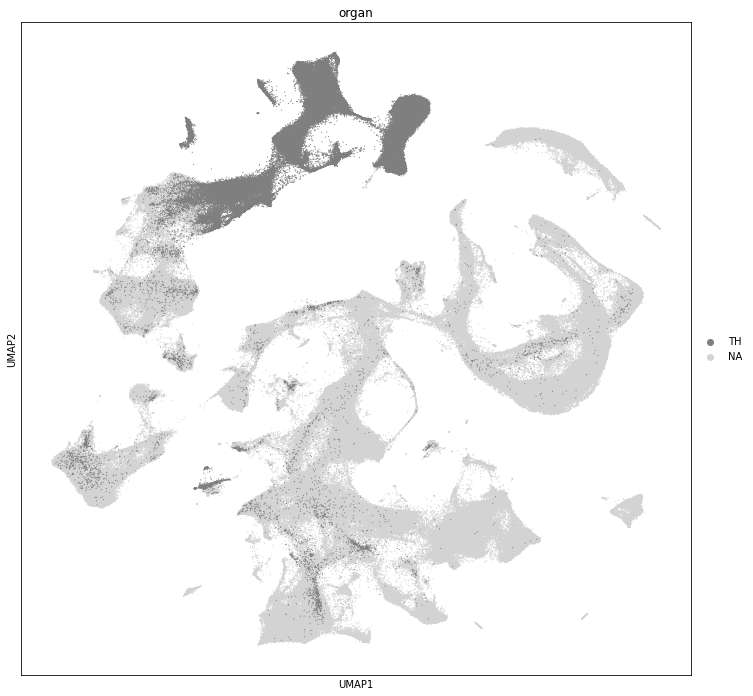

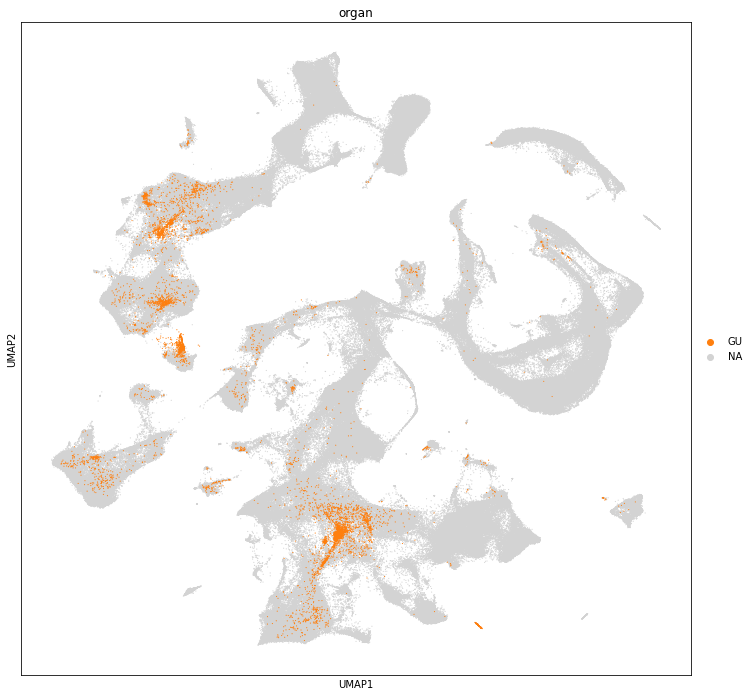

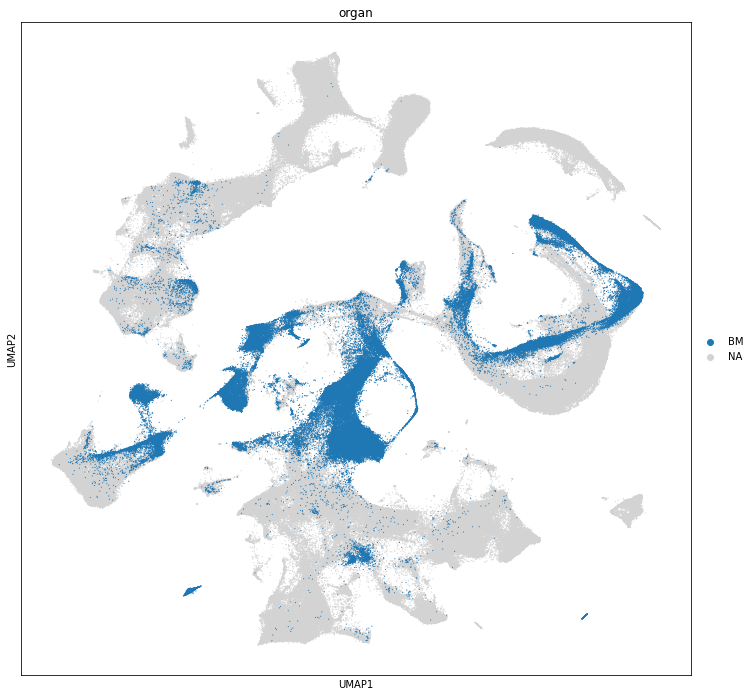

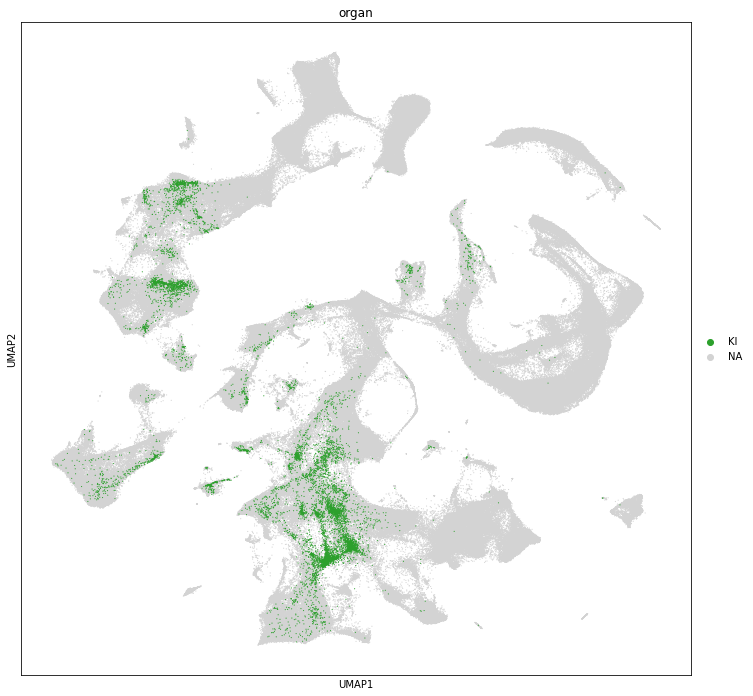

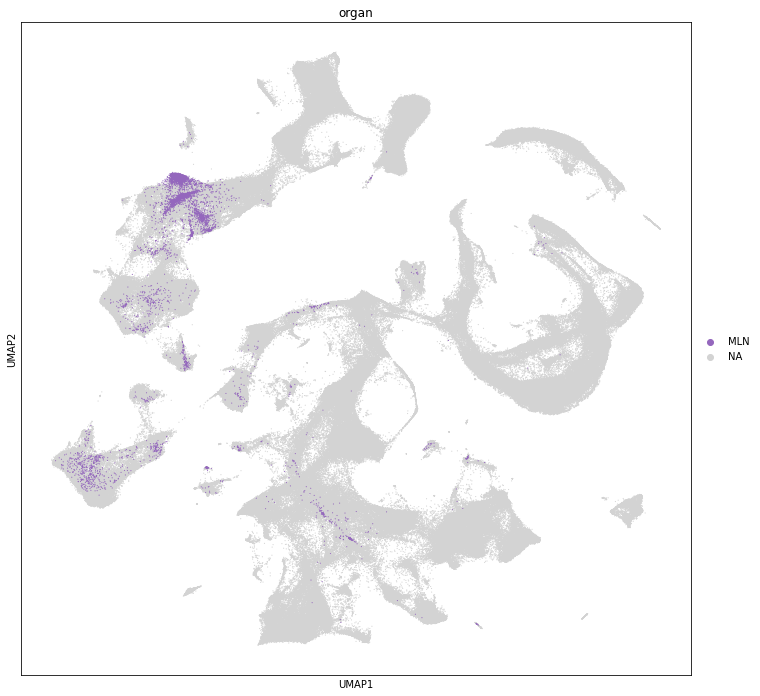

In [232]:
for o in adata.obs['organ'].unique():
    sc.pl.umap(adata, color=["organ"], groups=[o], size=5)

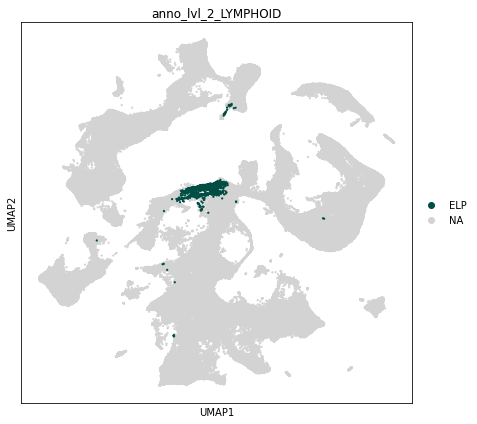

In [316]:
sc.pl.umap(adata, color=["anno_lvl_2_LYMPHOID"], size=20, ncols=3, groups=["ELP"])

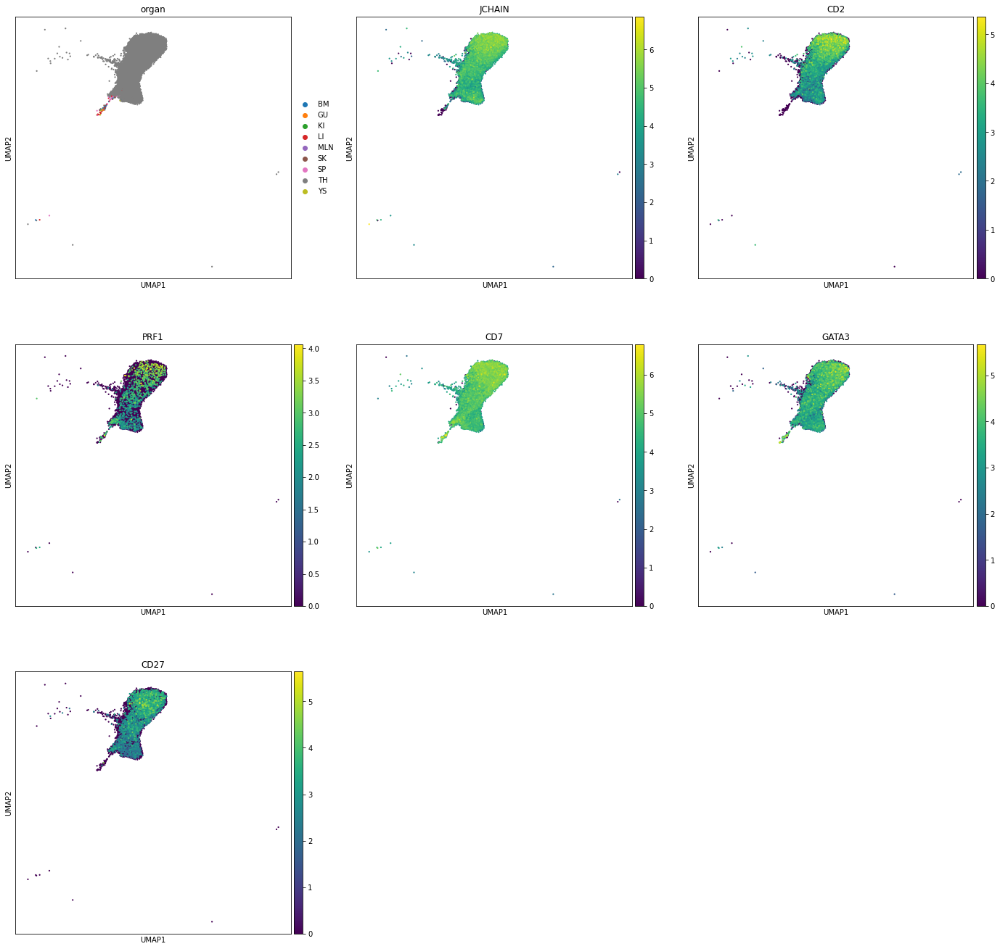

In [289]:
plt.rcParams["figure.figsize"] = [7,7]
sc.pl.umap(adata[adata.obs["scvi_clusters"].isin([6])], color=["organ", "JCHAIN", "CD2", "PRF1", "CD7", "GATA3","CD27"], size=20, ncols=3)

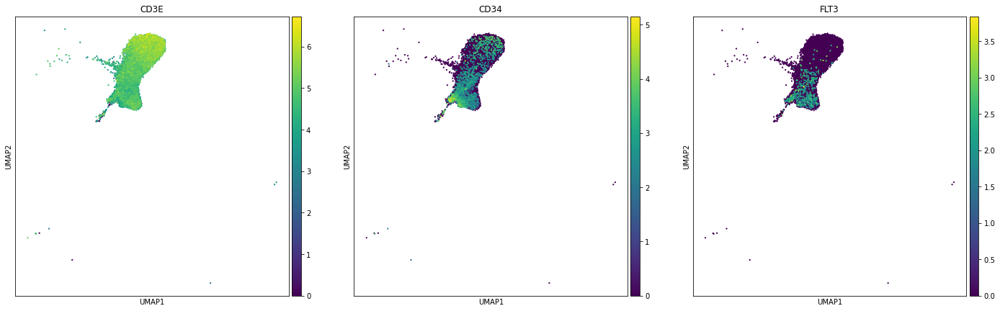

In [299]:
sc.pl.umap(adata[adata.obs["scvi_clusters"].isin([6])], color=["CD3E", "CD34",'FLT3'], size=20, ncols=3)

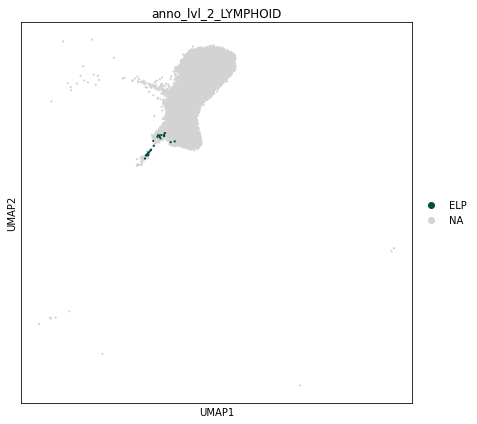

In [315]:
sc.pl.umap(adata[adata.obs["scvi_clusters"].isin([6])], color=["anno_lvl_2_LYMPHOID"], size=20, ncols=3, groups=["ELP"])

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


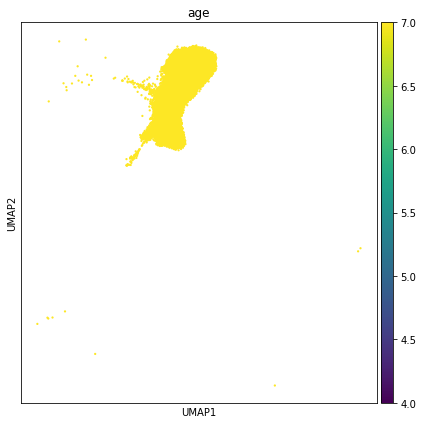

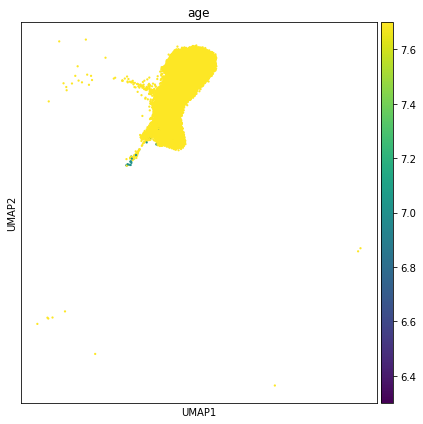

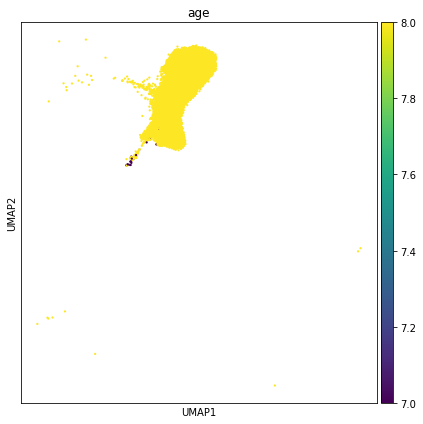

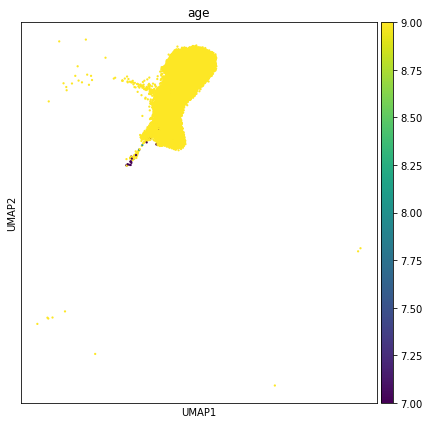

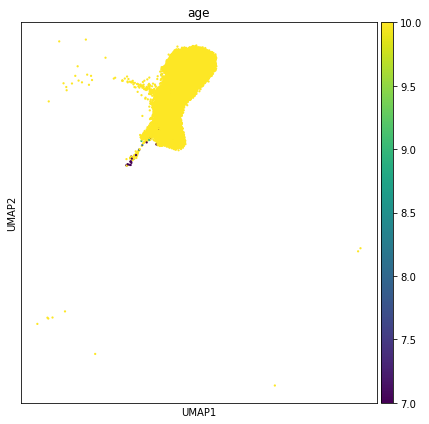

...

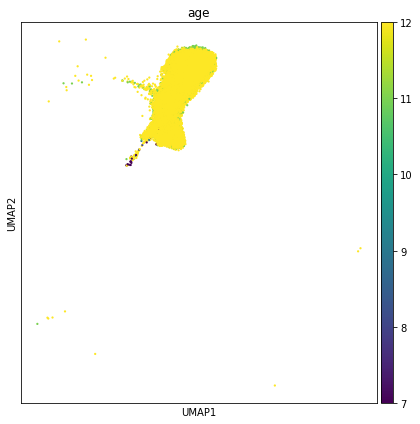

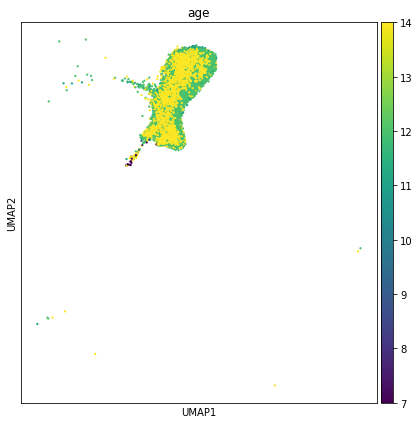

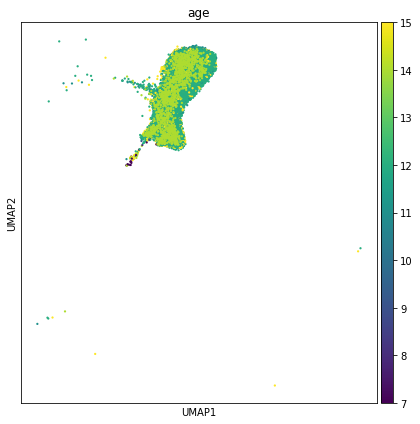

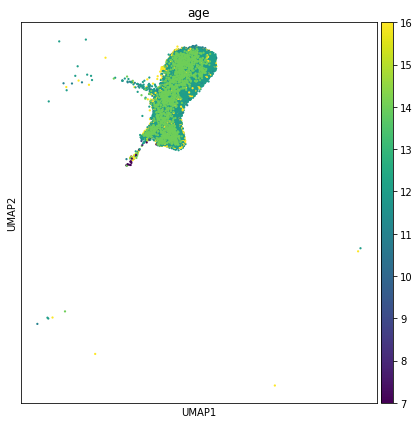

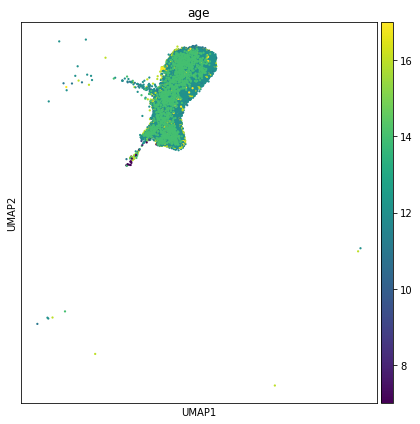

In [282]:
for a in adata.obs["age"].sort_values().unique():
    sc.pl.umap(adata[adata.obs["scvi_clusters"].isin([6])], color=["age"], vmax=a, size=20, ncols=3, sort_order=False)